In [3]:
# Run this
#!pip install umap-learn

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import warnings
warnings.filterwarnings("ignore")

mnist = fetch_openml('Fashion-MNIST', version=1, cache=True)

In [5]:
np.random.seed(123)

indices = np.random.choice(70000,10000)
X = mnist.data[indices] / 255.0
y = mnist.target[indices]

print(X.shape, y.shape)

(10000, 784) (10000,)


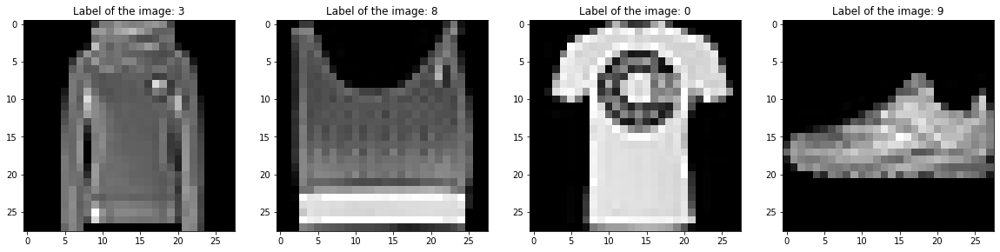

In [6]:
plt.figure(figsize=(20,5))

plt.subplot(141)
plt.imshow(X[123].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[21]))

plt.subplot(142)
plt.imshow(X[124].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[22]))

plt.subplot(143)
plt.imshow(X[125].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[23]))

plt.subplot(144)
plt.imshow(X[126].reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y[24]))

plt.show()

In [10]:
time_start = time.time()

umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

UMAP done! Time elapsed: 15.28925371170044 seconds


In [11]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

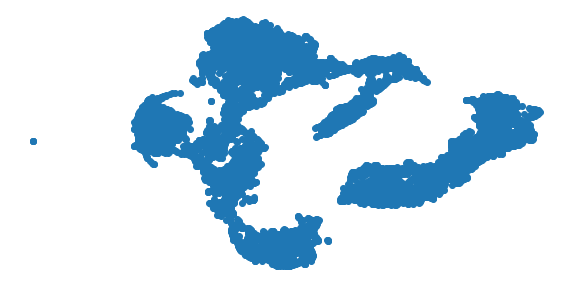

In [12]:
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

UMAPis better than t-SNE because the different classes are separated more clearly. Also it is faster than t-SNE

In [ ]:
k_neighbors = {7}
min_dist = {0.5,1}
for i in k_neighbors:    
    for j in min_dist:
        umap_results = umap.UMAP(n_neighbors=i,
                                 min_dist=j,
                                 metric='correlation').fit_transform(X)
        print("n_neighbours = {} and min_distance = {}".format(i,j))
        
        plt.figure(figsize=(10,5))
        colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
        for i in range(umap_results.shape[0]):
            plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
                     color=colours[int(y[i])],
                     fontdict={'weight': 'bold', 'size': 50}
                )
        plt.xticks([])
        plt.yticks([])
        plt.axis('off')
        plt.show()

n_neighbours = 7 and min_distance = 0.5
